# PSP and LSP Compatibility

In this code session, we will see how:
- Indipendently trained model are not compatible if their internal representations are used as features (extracted before the classifier)
- PSP and LSP inherently provide backward-compatibility by using features derived from softmax outputs and logits, respectively.

In [21]:
import torch
import torch.nn as nn
from torch.nn import functional as F
from typing import Dict
import torch
import matplotlib.pyplot as plt
import numpy as np
from typing import Union, Tuple, Dict, Optional
from collections import defaultdict
from sklearn.metrics import average_precision_score
import tqdm
from torchvision.models import resnet18, ResNet18_Weights, resnet152, ResNet152_Weights
from torchvision.models.feature_extraction import create_feature_extractor, get_graph_node_names
from torchvision.datasets import CIFAR10
from torchvision import transforms
import pandas as pd

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Definition of projection matrix to center the softmax outputs at the origin of the axis.

Given $C^k$ classes, the projection matrix $P_{k,k}$ is defined as:
$$
P_{k,k} = I - \frac{1}{C^k} \mathbf{J}
$$
where $I$ is the $C^k \times C^k$ identity matrix and $\mathbf{J}$ is a matrix of all ones. This matrix centers the softmax outputs by projecting it onto the hyperplane of a regular sipmlex.

In [22]:
def create_projection_matrix(num_classes):

    vertex_prob = np.eye(num_classes)

    center_vertex = np.mean(vertex_prob, axis=0)

    prototypes_prob = vertex_prob - center_vertex

    return torch.tensor(prototypes_prob).float()

# Cumulative Matching Characteristic (CMC)
The CMC metric evaluates Top$K$ retrieval accuracy by calculating pairwise distances between query and gallery feature representations.

A retrieval operation is classified as successful when at least one of the $K$ nearest gallery samples in the feature space corresponds to the same class label as the query sample.

Feature vector similarities are computed using cosine distance.

In [23]:
def cmc(
        distmat,
        query_ids=None,
        gallery_ids=None,
        topk=100,
        single_gallery_shot=False,
        first_match_break=False,
        per_class=False,
        verbose=False,
):
    """Compute Cumulative Matching Characteristics metric.

    From https://github.com/YantaoShen/openBCT/blob/main/evaluate/ranking.py
    """
    distmat = distmat.cpu().numpy()
    m, n = distmat.shape
    # Fill up default values
    if query_ids is None:
        query_ids = np.arange(m)
    if gallery_ids is None:
        gallery_ids = np.arange(n)

    # Ensure numpy array
    query_ids = np.asarray(query_ids)
    gallery_ids = np.asarray(gallery_ids)

    # Sort and find correct matches
    print('=> calculating argsort')
    indices = np.zeros(distmat.shape, dtype=np.int32)
    for i in tqdm.tqdm(range(0, m, 2)):
        indices[i:i+2, :] = np.argsort(distmat[i:i+2, :], axis=1)
    matches = gallery_ids[indices] == query_ids[:, np.newaxis]
    ret = np.zeros(topk)

    if per_class:
        ret_per_class = {cls: np.zeros(topk) for cls in set(gallery_ids)}
        num_valid_queries_per_class = {cls: 0 for cls in set(gallery_ids)}

    num_valid_queries = 0

    iterator = tqdm.tqdm(range(m)) if verbose else range(m)
    for i in iterator:
        if list(query_ids) == list(gallery_ids):
            # If query set is part of gallery set
            valid = np.arange(n)[indices[i]] != np.arange(m)[i]
        else:
            valid = None

        if not np.any(matches[i, valid]):
            continue

        if single_gallery_shot:
            repeat = 10
            gids = gallery_ids[indices[i][valid]]
            inds = np.where(valid)[0]
            ids_dict = defaultdict(list)

            for j, x in zip(inds, gids):
                ids_dict[x].append(j)
        else:
            repeat = 1

        for _ in range(repeat):
            if single_gallery_shot:
                # Randomly choose one instance for each id
                sampled = valid & _unique_sample(ids_dict, len(valid))
                index = np.nonzero(matches[i, sampled])[0]
            else:
                index = np.nonzero(matches[i, valid])[0]

            delta = 1.0 / (len(index) * repeat)

            for j, k in enumerate(index):
                if k - j >= topk:
                    break

                if first_match_break:
                    ret[k - j] += 1

                    if per_class:
                        ret_per_class[query_ids[i]][k - j] += 1

                    break

                ret[k - j] += delta

                if per_class:
                    ret_per_class[query_ids[i]][k - j] += delta

        num_valid_queries += 1

        if per_class:
            num_valid_queries_per_class[query_ids[i]] += 1

    if num_valid_queries == 0:
        raise RuntimeError("No valid query")

    if per_class:
        return ret.cumsum() / num_valid_queries, {
            cls: ret_class.cumsum() / num_valid_queries_per_class[cls]
            for cls, ret_class in ret_per_class.items()
        }
    else:
        return ret.cumsum() / num_valid_queries, indices

def _unique_sample(ids_dict, num):
    mask = np.zeros(num, dtype=np.bool)
    for _, indices in ids_dict.items():
        i = np.random.choice(indices)
        mask[i] = True
    return mask


def cosine_distance_matrix(x: torch.Tensor, y: torch.Tensor) -> torch.Tensor:
    """Get pair-wise cosine distances.

    :param x: A torch feature tensor with shape (n, d).
    :param y: A torch feature tensor with shape (n, d).
    :return: Distance tensor between features x and y with shape (n, n).
    """

    smaller_d = min(x.size(1), y.size(1))

    x = x[:, :smaller_d]
    y = y[:, :smaller_d]

    #normalize the features
    x = F.normalize(x, p=2, dim=1)
    y = F.normalize(y, p=2, dim=1)

    return 1 - x @ y.T


def cmc_evaluate(gallery_model: Union[nn.Module, torch.jit.ScriptModule],
                query_model: Union[nn.Module, torch.jit.ScriptModule],
                gallery_loader: torch.utils.data.DataLoader,
                query_loader: torch.utils.data.DataLoader,
                device: torch.device,
                distance_metric: str,
                verbose: bool = True,
                features_selected = 'logits',
               **kwargs
) -> Union[Tuple[Tuple[float, float], Optional[float]],
           Tuple[Tuple[Tuple[float, float], Dict], Optional[float]]]:
    """Run CMC and mAP evaluations.

    :param gallery_model: Model to compute gallery features.
    :param query_model: Model to compute query features.
    :param gallery_loader: Data loader for gallery data.
    :param query_loader: Data loader for query data.
    :param device: Device to use for computations.
    :param distance_metric: A callable that gets two feature tensors and return
        their distance tensor.
    :param verbose: Whether to be verbose.
    :param per_class: Whether to compute per class CMCs.
    :param compute_map: Whether to compute mean average precision.
    :return: Top-1 CMC, Top-5 CMC, optionally per class CMCs, optionally mAP.
    """
    distance_map = {'cosine': cosine_distance_matrix}
    distance_metric = distance_map.get(distance_metric)

    query_model.eval()
    gallery_model.eval()

    gallery_model.to(device)
    query_model.to(device)

    gallery_features = []
    query_features = []
    gallery_labels = []
    query_labels = []
    gallery_images = []
    query_images = []

    projection = create_projection_matrix(num_classes=1000).to(device)


    # Compute gallery features
    gallery_iterator = tqdm.tqdm(gallery_loader) if verbose else gallery_loader
    with torch.no_grad():
        for (paths, (data, label)) in gallery_iterator:
            data = data.to(device)
            label = label.to(device)

            if features_selected == 'logits':
                gallery_feature = gallery_model(data)['fc']
            if features_selected == 'softmax':
                gallery_feature = gallery_model(data)['fc']
                gallery_feature = F.softmax(gallery_feature, dim=1)
                # Projection of softmax outputs
                gallery_feature = gallery_feature @ projection.T
            if features_selected == 'internal':
                gallery_feature = gallery_model(data)['flatten']

            gallery_features.append(gallery_feature.squeeze().cpu())
            gallery_labels.append(label.cpu())
            gallery_images.append(data.cpu())

    # Compute query features
    query_iterator = tqdm.tqdm(query_loader) if verbose else query_loader
    with torch.no_grad():
        for (paths, (data, label)) in query_iterator:
            data = data.to(device)
            label = label.to(device)

            if features_selected == 'logits':
                query_feature = query_model(data)['fc']
            if features_selected == 'softmax':
                query_feature = query_model(data)['fc']
                query_feature = F.softmax(query_feature, dim=1)
                # Projection of softmax outputs
                query_feature = query_feature @ projection.T
            if features_selected == 'internal':
                query_feature = query_model(data)['flatten']

            query_features.append(query_feature.squeeze().cpu())
            query_labels.append(label.cpu())
            query_images.append(data.cpu())

    gallery_features = torch.cat(gallery_features)
    query_features = torch.cat(query_features)
    gallery_labels = torch.cat(gallery_labels)
    query_labels = torch.cat(query_labels)

    print("=> Computing Distance Matrix")
    distmat = distance_metric(query_features.cpu(), gallery_features.cpu())

    print("=> Starting CMC computation")
    cmc_scores, indices = cmc(
        distmat=distmat,
        query_ids=query_labels.cpu(),
        gallery_ids=gallery_labels.cpu(),
        topk=5,
        single_gallery_shot=False,
        first_match_break=True,
        verbose=verbose,
        per_class=False,
    )

    cmc_out = (cmc_scores[0]*100, cmc_scores[4]*100)

    return cmc_out, gallery_images, query_images, gallery_labels, query_labels, indices

# Definition of the evaluation dataset and its dataloader

A subset of CIFAR10 is used as evaluation dataset for both query and gallery samples.

In [24]:
class CIFAR10Subset(CIFAR10):
    def __init__(self, num_classes=None, num_samples_per_class=None, **kwargs):
        super().__init__(**kwargs)
        if num_classes is None:
            self.subset = len(self.classes)
        else:
            self.subset = num_classes
        assert self.subset <= len(self.classes)
        assert self.subset >= 0

        self.aligned_indices = []
        if num_samples_per_class is not None:
            # Group indices by class
            class_indices = {i: [] for i in range(self.subset)}
            for idx, label in enumerate(self.targets):
                if label < self.subset:
                    class_indices[label].append(idx)

            # Select the first num_samples_per_class per class (deterministic)
            for cls in range(self.subset):
                if len(class_indices[cls]) >= num_samples_per_class:
                    selected = class_indices[cls][:num_samples_per_class]
                else:
                    selected = class_indices[cls]  # If less than required, take all
                self.aligned_indices.extend(selected)
        else:
            for idx, label in enumerate(self.targets):
                if label < self.subset:
                    self.aligned_indices.append(idx)

    def get_class_names(self):
        return [self.classes[i] for i in range(self.subset)]

    def __len__(self):
        return len(self.aligned_indices)

    def __getitem__(self, item):
        return str(self.aligned_indices[item]), super().__getitem__(self.aligned_indices[item])


normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

transform_eval = transforms.Compose(
    [
        transforms.Resize(224),
        transforms.ToTensor(),
        normalize,
    ]
)

eval_dataset = CIFAR10Subset(num_classes=10, num_samples_per_class=60, root="./data",
                                    train=True,
                                    download=True,
                                    transform=transform_eval,)

eval_loader = torch.utils.data.DataLoader(
    eval_dataset,
    batch_size=64,
    shuffle=False,
    num_workers=1,
)

# Custom plot functions to visualize retrieved samples

In [25]:
# Function to plot images
def imshow(img, ax, title=None, color='black', border_color=None):
    # Ensure tensor on cpu
    if isinstance(img, torch.Tensor):
        img = img.detach().cpu()
    # Unnormalize for CIFAR
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    img = img * std + mean
    img = torch.clamp(img, 0, 1)
    npimg = img.numpy()
    ax.imshow(np.transpose(npimg, (1, 2, 0)))
    if title is not None:
        ax.set_title(title, color=color)
    # hide ticks but keep frame so we can draw colored border
    ax.set_xticks([])
    ax.set_yticks([])
    # Apply colored border using spines (works even when ticks are off)
    if border_color is not None:
        for spine in ax.spines.values():
            spine.set_edgecolor(border_color)
            spine.set_linewidth(4)
            spine.set_visible(True)
    else:
        # hide spines when no border requested
        for spine in ax.spines.values():
            spine.set_visible(False)

def plot_retrieval_results(gallery_images, query_images, gallery_labels, query_labels, indices):
  # Stack images
  gallery_images = torch.cat(gallery_images)
  query_images = torch.cat(query_images)
  gallery_labels = torch.stack([torch.tensor(label) if not isinstance(label, torch.Tensor) else label for label in gallery_labels])
  query_labels = torch.stack([torch.tensor(label) if not isinstance(label, torch.Tensor) else label for label in query_labels])

  # Get top retrieval order (keep full list to allow skipping identical images)
  # indices is expected to be a 2D tensor/array of shape (num_queries, num_gallery)
  # ensure it's a torch tensor on CPU
  if not isinstance(indices, torch.Tensor):
      indices = torch.tensor(indices)
  indices = indices.cpu()

  # Select 5 example query images from different classes
  example_indices = [0, 60, 120, 180, 240]

  # Plot the examples
  fig, axes = plt.subplots(5, 11, figsize=(20, 10))

  for i, query_idx in enumerate(example_indices):
      # Plot the query image
      axes[i, 0].set_title(f"Query: Class {int(query_labels[query_idx].item())}", fontweight='bold')
      imshow(query_images[query_idx], ax=axes[i, 0])

      # Build top-10 retrieved gallery indices while skipping identical images
      filtered = []
      for g_idx in indices[query_idx].tolist():
          # compare gallery image and query image; skip if identical
          gal_img = gallery_images[g_idx].detach().cpu()
          qry_img = query_images[query_idx].detach().cpu()
          if not torch.allclose(gal_img, qry_img, atol=1e-6):
              filtered.append(g_idx)
          if len(filtered) == 10:
              break

      # Plot the top-10 retrieved gallery images (or blank if not enough non-matching)
      for j in range(10):
          ax = axes[i, j + 1]
          if j < len(filtered):
              gallery_idx = filtered[j]
              retrieved_label = int(gallery_labels[gallery_idx].item())
              query_label = int(query_labels[query_idx].item())
              color = 'green' if retrieved_label == query_label else 'red'
              border_color = color
              ax.set_title(f"Rank {j+1}: Class {retrieved_label}", color=color)
              imshow(gallery_images[gallery_idx], ax=ax, border_color=border_color)
          else:
              # No non-matching image available for this rank: hide axis
              ax.set_xticks([])
              ax.set_yticks([])
              for spine in ax.spines.values():
                  spine.set_visible(False)
              ax.axis('off')

  plt.tight_layout(h_pad=2.0, w_pad=2.5)
  plt.show()

# Model Definitions

This section defines the neural network models used for both the gallery and query sets.

- **Gallery Model**: A ResNet18 model pre-trained on ImageNet1K is used as the gallery model.

- **Query Model**: Initially, a ResNet18 model pre-trained on ImageNet1K, identical to the gallery model, is used as the query model. This allows for evaluating compatibility when using the same model for both query and gallery.

- **Query Model Updated**: A ResNet152 model pre-trained on ImageNet1K_V2 is introduced as an 'updated' query model. This allows for evaluating compatibility when the query model is different from the gallery model.

In [26]:
#### GALLERY MODEL ####
gallery_model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1).eval()
gallery_model = create_feature_extractor(gallery_model, return_nodes={'flatten': 'flatten', 'fc': 'fc'})

#### QUERY MODEL ####
query_model = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1).eval()
query_model = create_feature_extractor(query_model, return_nodes={'flatten': 'flatten', 'fc': 'fc'})

#### QUERY MODEL UPDATED####
query_model_updated = resnet152(weights=ResNet152_Weights.IMAGENET1K_V2).eval()
query_model_updated = create_feature_extractor(query_model_updated, return_nodes={'flatten': 'flatten', 'fc': 'fc'})

# Internal features leads to uncompatible representation if Independently trained model are used.


Retrieval performance for the *same* ResNet18 model when using *internal* features

The `cmc_evaluate` function calculates the retrieval performance based on the cosine distance between the 'flatten' layer features of the models.

The printed output shows the Top-1 and Top-5 Cumulative Matching Characteristic (CMC) scores, which represent the percentage of queries for which the correct match is found within the top 1 and top 5 retrieved gallery images, respectively.

In [27]:
output_internal_same_model = cmc_evaluate(gallery_model,
                query_model,
                eval_loader,
                eval_loader,
                device,
                distance_metric='cosine',
                features_selected='internal'
                )

print()
print('CMC Top-1 = {}, CMC Top-5 = {}'.format(*output_internal_same_model[0]))

100%|██████████| 10/10 [00:01<00:00,  6.06it/s]


=> Computing Distance Matrix
=> Starting CMC computation
=> calculating argsort


100%|██████████| 600/600 [00:00<00:00, 8989.37it/s]


CMC Top-1 = 68.5, CMC Top-5 = 93.33333333333333


Plot the retrieval results for 5 examples of different classes



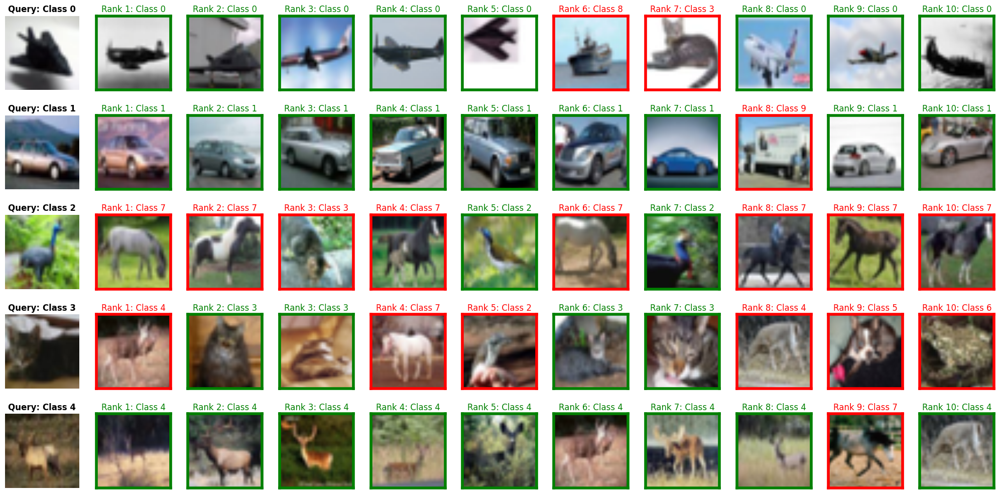

In [28]:
plot_retrieval_results(*output_internal_same_model[1:])

Retrieval performance for a ResNet18 as gallery model and the updated ResNet152 as query model when using *internal* features


In [29]:
output_internal_updated_model = cmc_evaluate(gallery_model,
                                          query_model_updated,
                                          eval_loader,
                                          eval_loader,
                                          device,
                                          distance_metric='cosine',
                                          features_selected='internal'
                                          )
print()
print('CMC Top-1 = {}, CMC Top-5 = {}'.format(*output_internal_updated_model[0]))

100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


=> Computing Distance Matrix
=> Starting CMC computation
=> calculating argsort


100%|██████████| 600/600 [00:00<00:00, 11312.87it/s]



CMC Top-1 = 6.333333333333334, CMC Top-5 = 25.166666666666664


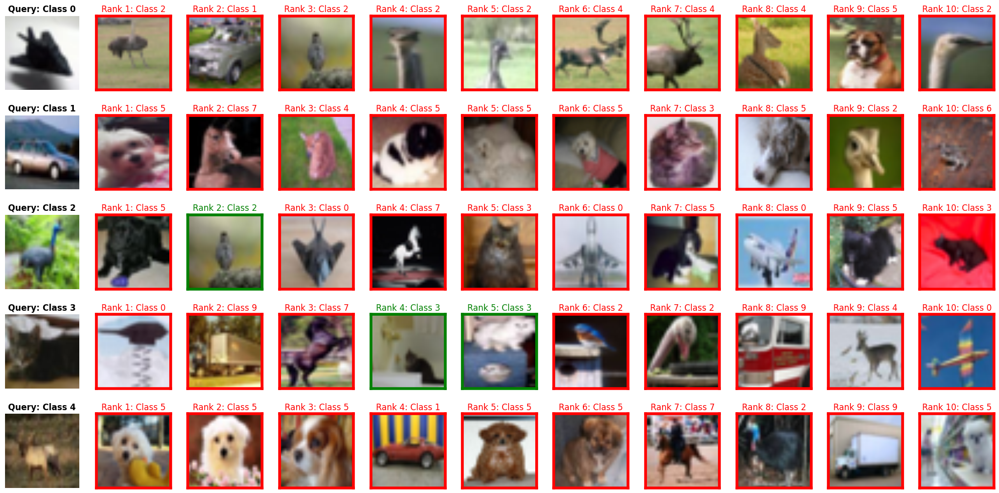

In [30]:
plot_retrieval_results(*output_internal_updated_model[1:])

# PSP: Using features derived from softmax outputs

Retrieval performance for the *same* ResNet18 model

In [31]:
output_softmax_same_model = cmc_evaluate(gallery_model,
                query_model,
                eval_loader,
                eval_loader,
                device,
                distance_metric='cosine',
                features_selected='softmax'
                )

print()
print('CMC Top-1 = {}, CMC Top-5 = {}'.format(*output_softmax_same_model[0]))

100%|██████████| 10/10 [00:01<00:00,  7.32it/s]


=> Computing Distance Matrix
=> Starting CMC computation
=> calculating argsort


100%|██████████| 600/600 [00:00<00:00, 11223.42it/s]


CMC Top-1 = 52.83333333333333, CMC Top-5 = 83.0


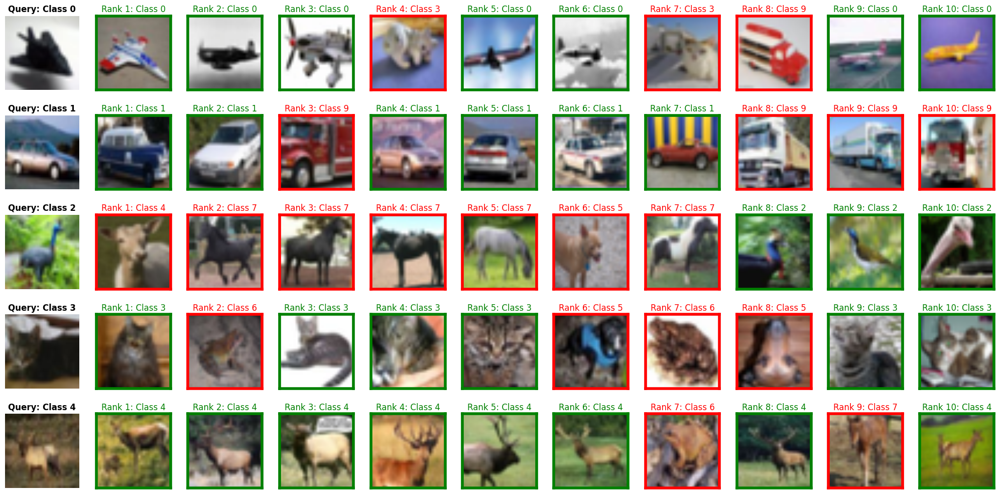

In [32]:
plot_retrieval_results(*output_softmax_same_model[1:])

Retrieval performance for a ResNet18 as gallery model and the updated ResNet152 as query model





In [33]:
output_softmax_updated_model = cmc_evaluate(gallery_model,
                query_model_updated,
                eval_loader,
                eval_loader,
                device,
                distance_metric='cosine',
                features_selected='softmax'
                )

print()
print('CMC Top-1 = {}, CMC Top-5 = {}'.format(*output_softmax_updated_model[0]))

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


=> Computing Distance Matrix
=> Starting CMC computation
=> calculating argsort


100%|██████████| 600/600 [00:00<00:00, 10601.72it/s]



CMC Top-1 = 71.5, CMC Top-5 = 89.16666666666667


#Plot of a compatible updated model retrieval results, thanks to PSP

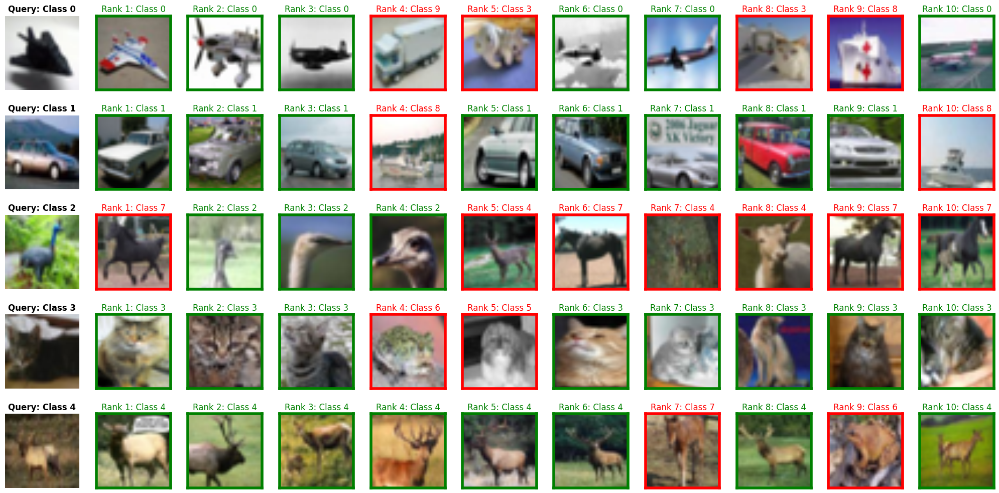

In [34]:
plot_retrieval_results(*output_softmax_updated_model[1:])

# LSP: Using features derived from logits

Retrieval performance for the *same* ResNet18 model

In [35]:
output_logits_same_model = cmc_evaluate(gallery_model,
                query_model,
                eval_loader,
                eval_loader,
                device,
                distance_metric='cosine',
                features_selected='logits'
                )

print()
print('CMC Top-1 = {}, CMC Top-5 = {}'.format(*output_logits_same_model[0]))

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:01<00:00,  7.01it/s]


=> Computing Distance Matrix
=> Starting CMC computation
=> calculating argsort


100%|██████████| 600/600 [00:00<00:00, 11880.37it/s]


CMC Top-1 = 65.33333333333333, CMC Top-5 = 94.33333333333334


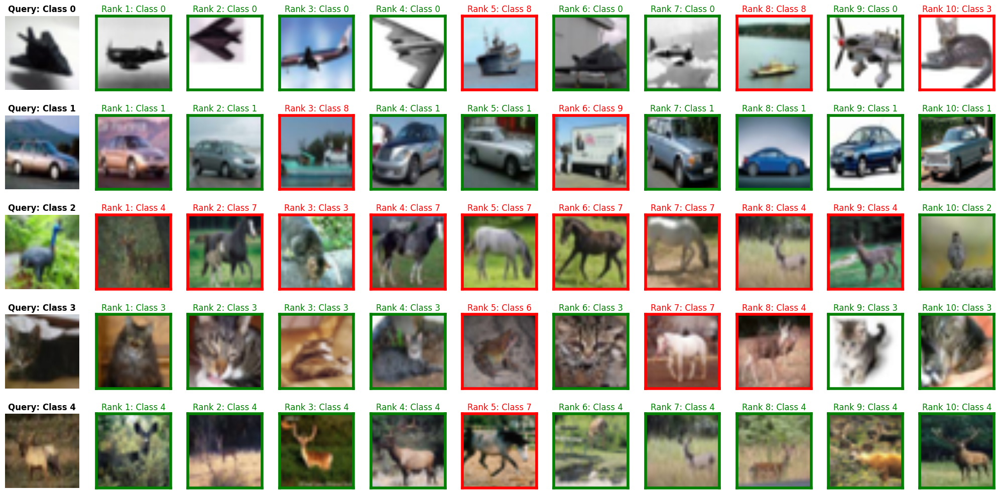

In [36]:
plot_retrieval_results(*output_logits_same_model[1:])

Retrieval performance for a ResNet18 as gallery model and the updated ResNet152 as query model

In [37]:
output_logits_updated_model = cmc_evaluate(gallery_model,
                query_model_updated,
                eval_loader,
                eval_loader,
                device,
                distance_metric='cosine',
                features_selected='logits'
                )

print()
print('CMC Top-1 = {}, CMC Top-5 = {}'.format(*output_logits_updated_model[0]))

100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


=> Computing Distance Matrix
=> Starting CMC computation
=> calculating argsort


100%|██████████| 600/600 [00:00<00:00, 11046.17it/s]



CMC Top-1 = 75.0, CMC Top-5 = 93.66666666666667


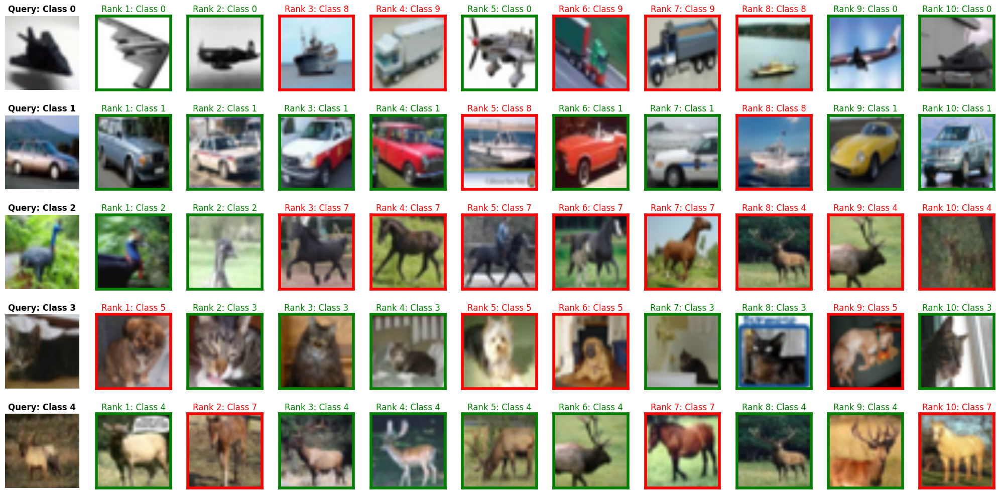

In [38]:
plot_retrieval_results(*output_logits_updated_model[1:])

# Empirical Compatibility evaluation

$$
M \big( \phi^t, \phi^k; \mathcal{Q}, \mathcal{G} \big) >
M \big( \phi^k, \phi^k; \mathcal{Q}, \mathcal{G} \big) \quad \text{with } t > k,
$$

where $M$ represents a performance metric.

This code uses the CMC Top-1 retrieval performance for the different feature extraction methods (internal, PSP, and LSP) as $M$.

The 'Compatible' column visually indicates whether the updated model achieved compatibility (tick) or not (cross).

In [39]:
# Extract CMC Top-1 scores from the output variables
cmc_internal_same = output_internal_same_model[0][0]
cmc_internal_updated = output_internal_updated_model[0][0]
cmc_softmax_same = output_softmax_same_model[0][0]
cmc_softmax_updated = output_softmax_updated_model[0][0]
cmc_logits_same = output_logits_same_model[0][0]
cmc_logits_updated = output_logits_updated_model[0][0]

# Create a dictionary to hold the data
data = {
    'Feature from': ['Internal', 'Softmax', 'Logits'],
    'Same Model': [cmc_internal_same, cmc_softmax_same, cmc_logits_same],
    'Updated Model': [cmc_internal_updated, cmc_softmax_updated, cmc_logits_updated],
    'Compatible': ['' for _ in range(3)] # Placeholder for compatibility indicator
}

# Create the DataFrame
results_df = pd.DataFrame(data)

# Determine compatibility and add tick or cross
results_df['Compatible'] = results_df.apply(lambda row: '✅' if row['Updated Model'] > row['Same Model'] else '❌', axis=1)

# Round the numeric columns to two decimal places
results_df['Same Model'] = results_df['Same Model'].round(2)
results_df['Updated Model'] = results_df['Updated Model'].round(2)


# Display the table
display(results_df)

,Feature from,Same Model,Updated Model,Compatible
0,Internal,68.50,6.33,❌
1,Softmax,52.83,71.50,✅
2,Logits,65.33,75.00,✅
